In [2]:
df0 = pd.read_csv('df0.csv', encoding='euc-kr')
df1 = pd.read_csv('df1.csv', encoding='euc-kr' )


In [3]:
df_cluster = df1.copy()

In [4]:
for_scaling=df_cluster[['sales','workpop', 'floatpop',
       'prop_2030s', 'prop_06_11', 'prop_11_14', 'prop_14_17', 'prop_17_21',
       'prop_21_24', 'apt_no_of_cmplx', 'apt_avg_space', 'apt_avg_price',
       'inc_monthly_avg', 'expnd_total', 'no_of_store', 'no_of_franch_store',
       'no_of_bank', 'no_of_pharm', 'no_of_theartre', 'no_of_accom',
       'no_of_STA','sales_female_ratio', 'sales_weekday_ratio']]
not_for_scaling = df_cluster[['district', 'code']]

In [5]:
#로버스트 스케일링
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler


rb = RobustScaler()
# rb = StandardScaler()
rb.fit(for_scaling)
df_robust_scaled = rb.transform(for_scaling)
df_robust_scaled = pd.DataFrame(df_robust_scaled, columns=for_scaling.columns)
df_robust_scaled.tail()


,sales,workpop,floatpop,prop_2030s,prop_06_11,prop_11_14,prop_14_17,prop_17_21,prop_21_24,apt_no_of_cmplx,...,expnd_total,no_of_store,no_of_franch_store,no_of_bank,no_of_pharm,no_of_theartre,no_of_accom,no_of_STA,sales_female_ratio,sales_weekday_ratio
88750,6.463134,-0.387755,-0.422425,-1.161050,1.919463,0.657132,0.358080,-0.940554,-0.241184,0.90566,...,1.085599,0.00,1.0,0.0,1.0,0.0,-0.5,0.0,0.129580,0.917877
88751,-0.322002,-0.387755,-0.422425,-1.237440,0.048349,1.420966,0.332281,-0.614491,-0.241184,0.90566,...,1.085599,-0.25,0.0,0.0,1.0,0.0,-0.5,0.0,-0.008554,0.079909
88752,-0.296208,-0.387755,-0.422425,0.584098,-0.277150,0.487580,0.472706,0.119282,0.001926,0.90566,...,1.085599,-0.50,0.0,0.0,1.0,0.0,-0.5,0.0,0.726007,0.285065
88753,-0.337847,-0.387755,-0.422425,-0.665074,1.041465,1.097324,-0.147703,-0.393011,-0.217756,0.90566,...,1.085599,0.00,0.0,0.0,1.0,0.0,-0.5,0.0,-0.652333,-0.508742
88754,-0.356413,-0.387755,-0.422425,0.681334,-0.277150,-0.316758,0.979725,0.651369,-0.241184,0.90566,...,1.085599,0.75,0.0,0.0,1.0,0.0,-0.5,0.0,1.895319,-1.110968


In [6]:
df_robust_scaled.columns[1:]

Index(['workpop', 'floatpop', 'prop_2030s', 'prop_06_11', 'prop_11_14',
       'prop_14_17', 'prop_17_21', 'prop_21_24', 'apt_no_of_cmplx',
       'apt_avg_space', 'apt_avg_price', 'inc_monthly_avg', 'expnd_total',
       'no_of_store', 'no_of_franch_store', 'no_of_bank', 'no_of_pharm',
       'no_of_theartre', 'no_of_accom', 'no_of_STA', 'sales_female_ratio',
       'sales_weekday_ratio'],
      dtype='object')

In [7]:
#우선 처음에는 상권 코드만 클러스터링 하고자함
# 노트북에서 모두 돌아가지 않아 1000개, n_neighbors=100으로 실행
# 궁극적으로는 .loc[:1000]을 지우고 실행해야함
# n_neighbors는 np.unique(y_pred) 한 결과가 약 25개정도 나올때까지 점점 늘려나갈 예정

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.neighbors import (NeighborhoodComponentsAnalysis,KNeighborsClassifier)


X= df_robust_scaled[df_robust_scaled.columns[1:]]
y= not_for_scaling['district']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.7, random_state=42)
nca = NeighborhoodComponentsAnalysis(random_state=42)
knn = KNeighborsClassifier(n_neighbors=100)
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])
nca_pipe.fit(X_train, y_train)

y_pred = nca_pipe.predict(X_test)

# model = sm.OLS.from_formula("SalesPerStore  ~ C(Code) +"+"+".join(df1_robust_scaled[df1_robust_scaled.columns[3:]]), data=df1_robust_scaled)

# result = model.fit()
# print(result.summary())

In [8]:
len(y)

88755

In [9]:
len(np.unique(y_pred)) # 군집화 한 결과 district 종류

array([1000003, 1000010, 1000016, 1000019, 1000028, 1000030, 1000032,
       1000033, 1000034, 1000040, 1000042, 1000047, 1000048, 1000061,
       1000067, 1000071, 1000072, 1000073, 1000079, 1000085, 1000087,
       1000088, 1000091, 1000094, 1000098, 1000099, 1000102, 1000103,
       1000104, 1000107, 1000110, 1000112, 1000118, 1000120, 1000121,
       1000123, 1000127, 1000129, 1000133, 1000134, 1000136, 1000137,
       1000139, 1000140, 1000142, 1000146, 1000148, 1000149, 1000152,
       1000154, 1000156, 1000157, 1000158, 1000161, 1000162, 1000163,
       1000165, 1000166, 1000167, 1000173, 1000177, 1000178, 1000180,
       1000184, 1000185, 1000189, 1000190, 1000193, 1000195, 1000196,
       1000198, 1000200, 1000201, 1000204, 1000207, 1000214, 1000215,
       1000216, 1000217, 1000220, 1000221, 1000222, 1000226, 1000229,
       1000230, 1000232, 1000233, 1000235, 1000237, 1000239, 1000242,
       1000243, 1000244, 1000245, 1000247, 1000249, 1000252, 1000254,
       1000257, 1000

In [10]:
len(np.unique(np.array(y_test)))  #원래 district 종류

array([1000001, 1000003, 1000004, 1000005, 1000006, 1000007, 1000008,
       1000009, 1000010, 1000011, 1000012, 1000013, 1000014, 1000015,
       1000016, 1000019, 1000020, 1000021, 1000022, 1000023, 1000024,
       1000025, 1000026, 1000027, 1000028, 1000029, 1000030, 1000031,
       1000032, 1000033, 1000034, 1000035, 1000036, 1000037, 1000040,
       1000041, 1000042, 1000043, 1000044, 1000045, 1000046, 1000047,
       1000048, 1000049, 1000050, 1000051, 1000052, 1000053, 1000054,
       1000055, 1000056, 1000057, 1000058, 1000059, 1000060, 1000061,
       1000062, 1000063, 1000064, 1000065, 1000066, 1000067, 1000068,
       1000069, 1000070, 1000071, 1000072, 1000073, 1000074, 1000075,
       1000076, 1000077, 1000078, 1000079, 1000080, 1000081, 1000082,
       1000084, 1000085, 1000086, 1000087, 1000088, 1000089, 1000090,
       1000091, 1000093, 1000094, 1000095, 1000096, 1000097, 1000098,
       1000099, 1000100, 1000101, 1000102, 1000103, 1000104, 1000105,
       1000106, 1000

In [11]:
a=pd.DataFrame(np.array(y_test))
b=pd.DataFrame(y_pred)
KNN_result= pd.concat([a,b],axis=1)

# KNN_result.columns=['original','result']
KNN_result.columns=['district','new_district']
KNN_result.groupby(['district']).agg(lambda x:x.value_counts().index[0])
KNN_result.tail()

,district,new_district
0,1000499,1000499
1,1000653,1000653
2,1000148,1000148
3,1000773,1000193
4,1000834,1000834
5,1000304,1000308
6,1000101,1000596
7,1000886,1000979
8,1000946,1000946
9,1000057,1000758


In [12]:
# district : 원래 district
# new_district: 군집화 한 결과 
# 앞으로 할일: 전체 코드를 군집화한 코드로 변경하여 OLS

In [13]:
####군집화한 코드 변경하기


In [14]:
df_cluster_result = df_cluster.copy()

In [15]:
df_cluster_result  = df_cluster_result.loc[:1000]

In [16]:
df_cluster_result = pd.merge(df_cluster_result, KNN_result,on=['district'])


In [17]:
df_cluster_result[df_cluster_result['new_district'].isnull()]

,year,quarter,district,code,workpop,floatpop,prop_2030s,prop_06_11,prop_11_14,prop_14_17,...,no_of_franch_store,no_of_bank,no_of_pharm,no_of_theartre,no_of_accom,no_of_STA,sales,sales_female_ratio,sales_weekday_ratio,new_district


In [18]:
df_cluster_result=df_cluster_result[['sales','code','new_district', 'workpop', 'floatpop', 'prop_2030s',
       'prop_06_11', 'prop_11_14', 'prop_14_17', 'prop_17_21', 'prop_21_24',
       'apt_no_of_cmplx', 'apt_avg_space', 'apt_avg_price', 'inc_monthly_avg',
       'expnd_total', 'no_of_store', 'no_of_franch_store', 'no_of_bank',
       'no_of_pharm', 'no_of_theartre', 'no_of_accom', 'no_of_STA',
       'sales_female_ratio', 'sales_weekday_ratio']]

In [19]:
dummies = pd.get_dummies(df_cluster_result['new_district'], prefix='d')
df_dummy_added = pd.concat([df_cluster_result,dummies] ,axis=1)
df_dummy_added=df_dummy_added.drop(columns='new_district')
df_dummy_added.tail()

,sales,code,workpop,floatpop,prop_2030s,prop_06_11,prop_11_14,prop_14_17,prop_17_21,prop_21_24,...,d_1000855,d_1000861,d_1000864,d_1000866,d_1000867,d_1000872,d_1000919,d_1000974,d_1000980,d_1000993
0,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
1,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
2,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
3,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
4,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
5,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
6,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
7,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
8,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1
9,922621269.0,CS100001,831.0,188508.0,0.409338,0.011467,0.407748,0.151499,0.346293,0.082993,...,0,0,0,0,0,0,0,0,0,1


In [21]:
import statsmodels.api as sm

X= df_dummy_added[df_dummy_added.columns[2:]]
y= df_dummy_added['sales']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.7, random_state=42)

df_train=pd.concat([y_train,X_train], axis=1)


model= sm.OLS.from_formula("sales ~ "+" + ".join(df_train.columns[2:]), data=df_train)
result =  model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.369
Model:                            OLS   Adj. R-squared:                  0.367
Method:                 Least Squares   F-statistic:                     162.7
Date:                Sun, 15 Dec 2019   Prob (F-statistic):               0.00
Time:                        19:11:25   Log-Likelihood:            -3.6851e+05
No. Observations:               17583   AIC:                         7.371e+05
Df Residuals:                   17519   BIC:                         7.376e+05
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            5.671e+08   1

In [22]:
#오차합 구하기
y_pred = result .predict(X_test)
resid=y_test-y_pred
rss=np.sum(resid**2)
MSE=rss/(result.nobs-2)

#RMSE 구하기
from statsmodels.tools.eval_measures import rmse

rmse = rmse(y_test, y_pred)
MSE, rmse


(2.1043762879265725e+17, 300288029.92952055)

In [23]:
##부분회귀분석 :CCPR플롯으로 표현
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15, 30))
sm.graphics.plot_ccpr_grid(result, fig=fig)
fig.suptitle("")
plt.show()

In [24]:
#1. 변수에 저장
import pickle
from sklearn.externals import joblib
KNN_cluster = pickle.dumps(nca_pipe)

C:\Users\SJ\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [ ]:
#### 결론
- r-square 값이 낮아졌다. 
- 서비스 코드를 더미변수로 넣으면 좀 더 높아진다
- 평가기준을 r-square가 아닌 오차합 또는 M

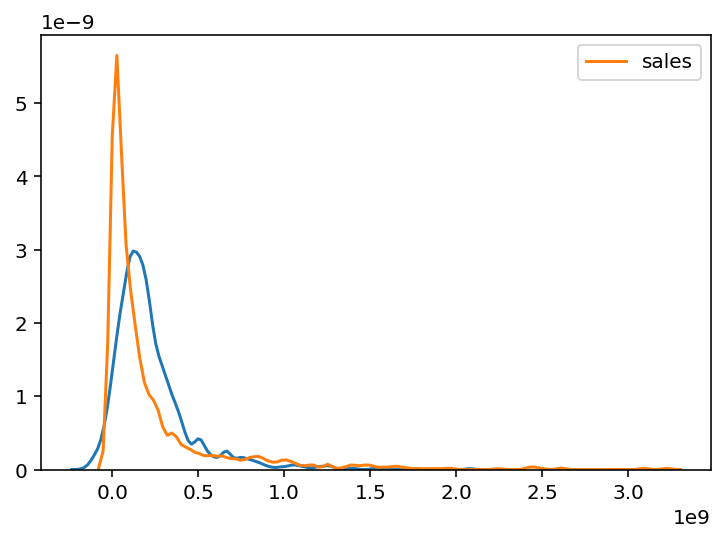

In [167]:
y_pred = result .predict(X_test)
sns.kdeplot(y_pred)
sns.kdeplot(y_test,)
# plt.title("")
plt.show()

In [182]:
for_plot=df_cluster_result[['sales', 'new_district', 'workpop', 'floatpop', 'prop_2030s',
       'prop_06_11', 'prop_11_14', 'prop_14_17', 'prop_17_21', 'prop_21_24',
       'apt_no_of_cmplx', 'apt_avg_space', 'apt_avg_price', 'inc_monthly_avg',
       'expnd_total', 'no_of_store', 'no_of_franch_store', 'no_of_bank',
       'no_of_pharm', 'no_of_theartre', 'no_of_accom', 'no_of_STA',
       'sales_female_ratio', 'sales_weekday_ratio']]

In [184]:
sns.pairplot(for_plot, hue="new_district")
plt.title("new_district")
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


## 참고 모델 저장하는법(모델링에 실패해서 지금 저장하지는 않음)
#1. 변수에 저장하고 확인하기
```
import pickle
from sklearn.externals import joblib
X,y =iris.data, iris.target
clf = LogisticRegression(random_state=0)
clf.fit(X,y)

saved_model = pickle.dumps(clf)

```
#모델 불러와서 예측하기
```
#load
clf_from_pickle = pickle.loads(saved_model)

#use model
clf_from_pickle.predict(X)

```

#모델을 파일로 저장하기
```
joblib.dump(clf,'filename.pkl')

```

#저장한 파일 불러와서 예측하기
```
clf_from_joblib = joblib.load('filename.pkl')
clf_from_joblib.predict(X)
```


